In [ ]:
# Checkpoint 2 requirements

# Submit a jupyter notebook file (.ipynb) on Gradescope with:
# ● (5 points) Data preprocessing: (a) import, (b) parse (e.g., convert strings to ints), (c)
# organize (e.g., set up a database or a pandas DataFrame).

# ● (20 points) Basic data exploration and summary statistics
# ○ You must present three conclusions using at least three different statistical
# methods including hypothesis testing.

# ■ For example: What are the main characteristics of your dataset? How
# many features and entries are there? Is a feature over-represented? Are
# features correlated? Are there outliers? Identify the attributes that will
# affect your choice of primary analysis technique. Etcetera.

# ○ For each method, you must have at least one gorgeous plot.

# **CMSC320 Final Project**
Aditya Koul, Arnav Kamath, Nithin Nambi, Archer Sariscak
<br>
<br>
<br>


### **Data Preprocessing**
In the code below, we will import, parse, and organize our data

In [1]:
# Import statements
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# File paths
building_footprint_kml = '../training_data/Building_Footprint.kml'
NY_weather_xlsx = '../training_data/NY_Mesonet_Weather.xlsx'
UHI_data_csv = '../training_data/Training_data_uhi_index_2025-02-18.csv'


## Building Footprint Data Analysis

Data Exploration and Summary Statistics

In [2]:
import geopandas as gpd

gdf = gpd.read_file(building_footprint_kml, driver='KML')
df = pd.DataFrame(gdf)
print(df.head())
# In the first few rows, we can see that the Name and Description columns are all the same. 
# The geometry column contains geometrical data representing the building footprints, in the form of MULTIPOLYGON.


  Name Description                                           geometry
0                   MULTIPOLYGON (((-73.91903 40.8482, -73.91933 4...
1                   MULTIPOLYGON (((-73.92195 40.84963, -73.92191 ...
2                   MULTIPOLYGON (((-73.9205 40.85011, -73.92045 4...
3                   MULTIPOLYGON (((-73.92056 40.8514, -73.92053 4...
4                   MULTIPOLYGON (((-73.91234 40.85218, -73.91247 ...


In [3]:
print(df.dtypes)
# The Name and Description columns are objects (strings), while geometry is a geometry type, 
# which is expected as this column is geospatial data (polygonal geometries of the buildings).

Name             object
Description      object
geometry       geometry
dtype: object


In [4]:
print(df.describe(include=[object]))
# With describe we are able to see that the Name and Description columns each have only one unique value. 
# Since every entry is the same, we can ignore these columns for most types of analysis.

        Name Description
count   9436        9436
unique     1           1
top                     
freq    9436        9436


In [5]:
print(df.info())
# The dataset contains 9436 entries and 3 columns. All columns are non-null, 
# meaning there are no missing values in any of them. This is good because it ensures 
# that our analysis will not be affected by missing data.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9436 entries, 0 to 9435
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   Name         9436 non-null   object  
 1   Description  9436 non-null   object  
 2   geometry     9436 non-null   geometry
dtypes: geometry(1), object(2)
memory usage: 221.3+ KB
None


In [6]:
missing_data = df.isna().sum()
print("Missing data:", missing_data)
# There is no missing data in the dataset, as expected, since all columns show 0 missing values.
# This indicates that we have a clean dataset in terms of completeness.

Missing data: Name           0
Description    0
geometry       0
dtype: int64


In [26]:
gdf = gdf.to_crs(epsg=3395) #EPSG:3395 uses meters as units
gdf['area'] = gdf.geometry.area
print(gdf[['Name', 'area']].head())
# The areas of the buildings vary significantly, with values like 1080.60 m², 166.11 m², and so on.
# This suggests that the dataset includes buildings of different sizes.

  Name         area
0       1080.601783
1        166.114638
2        246.325998
3        138.914032
4        376.844794


In [ ]:
gdf['area'].max()
# The building with the largest are is 124277 m^2

124277.64962663146

Conclusion:
From the initial exploration, we found that the dataset contains only a small amount of variation in Name and Description. These columns don't contribute much to further analysis. We also confirmed that there is no missing data. Now, we should focus on exploring the geometrical data (building footprints), which likely holds the most relevant information for further analysis.

Hypothesis Testing

In [8]:
mean_area = gdf['area'].mean()
print(f"Mean area of the buildings: {mean_area} square meters")
# The mean area of the buildings is approximately 3479.11 m².
# This provides a reference value for our hypothesis testing.

Mean area of the buildings: 3479.1095318903667 square meters


In [9]:
from scipy import stats

t_area = 3500
t_stat, p_value = stats.ttest_1samp(gdf['area'], t_area)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

T-statistic: -0.3687783722102992, P-value: 0.7123012012016201


In [10]:
if p_value < 0.05: # Did it like this because I played around with the test area t_area.
    print(f"We reject the null hypothesis: The average area is significantly different from {t_area} square meters.")
else:
    print(f"We fail to reject the null hypothesis: The average area is not significantly different from {t_area} square meters.")

# The t-statistic is -0.37, and the p-value is 0.71.
# The t-statistic indicates that the sample mean is slightly less than the threshold.
# However, the p-value is much greater than 0.05, which means we fail to reject the null hypothesis.

We fail to reject the null hypothesis: The average area is not significantly different from 3500 square meters.


Plots

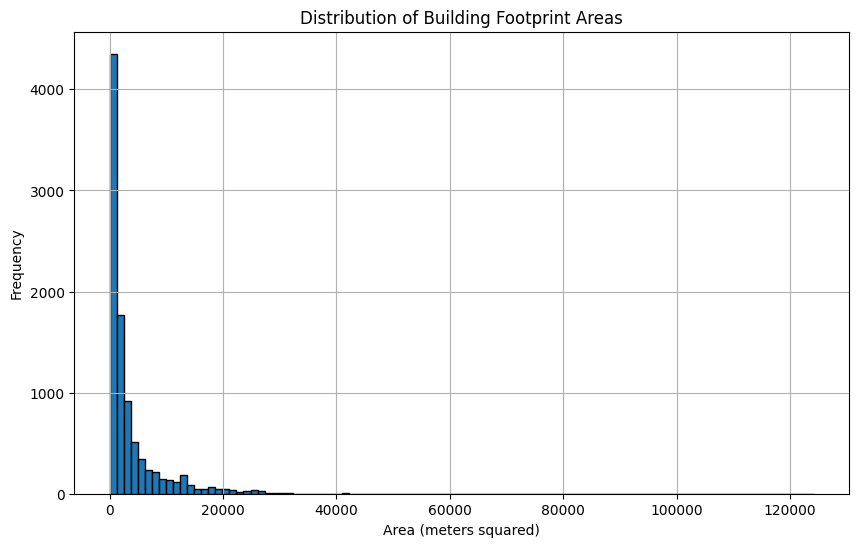

In [33]:
plt.figure(figsize=(10, 6))
gdf['area'].hist(bins=100, edgecolor='black')
plt.title('Distribution of Building Footprint Areas')
plt.xlabel('Area (meters squared)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# The large peak on the left indicates that most buildings in NYC are very small.
# The long tail to the right shows that there are some buildings that are much larger, but there are relatively few.
# This suggests that the data has a few large outliers but the majority of buildings are relatively small in terms of area.


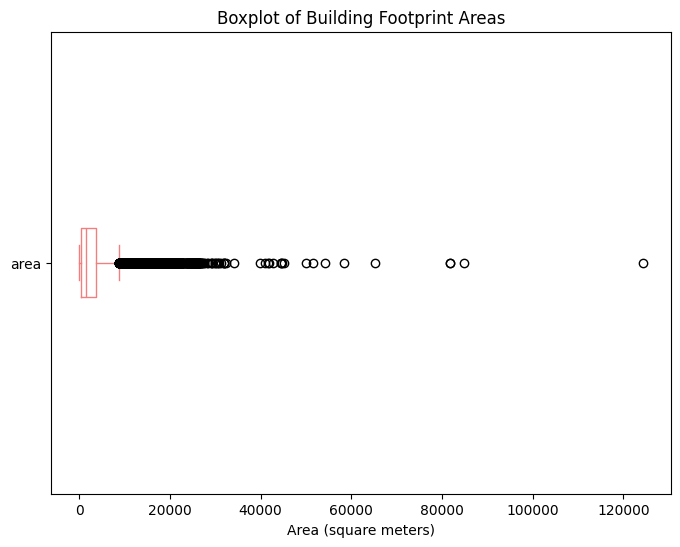

In [ ]:
plt.figure(figsize=(8, 6))
gdf['area'].plot(kind='box', vert=False, color='lightcoral')
plt.title('Boxplot of Building Footprint Areas')
plt.xlabel('Area (meters squared)')
plt.show()

# The boxplot provides a visualization of the spread and outliers in the building area data. 
# The central 50% of the building areas are in between the lower and upper quartiles,
# with a lots of outliers visible on the upper end of the plot. 
# These outliers represent buildings with areas that are larger than the median, 
# and could represent very large buildings or errors in the data. 
# The boxplot highlights the presence of extreme values, which could influence the overall statistics.



## NY Weather Data Analysis

## UHI Data Analysis

In [12]:
UHI_df = pd.read_csv(UHI_data_csv)
print(UHI_df.head())

   Longitude   Latitude          datetime  UHI Index
0 -73.909167  40.813107  24-07-2021 15:53   1.030289
1 -73.909187  40.813045  24-07-2021 15:53   1.030289
2 -73.909215  40.812978  24-07-2021 15:53   1.023798
3 -73.909242  40.812908  24-07-2021 15:53   1.023798
4 -73.909257  40.812845  24-07-2021 15:53   1.021634


In [13]:
UHI_df.dtypes

Longitude    float64
Latitude     float64
datetime      object
UHI Index    float64
dtype: object

In [14]:
# We see that this CSV file has four features: Longitude, Latitude, datetime, and
# UHI Index. However, the datetime column does not contain datetime objects, so
# we must first convert the column to hold datetime objects.

UHI_df['datetime'] = pd.to_datetime(UHI_df['datetime'], format="%d-%m-%Y %H:%M")
UHI_df.dtypes
print(UHI_df.head())


   Longitude   Latitude            datetime  UHI Index
0 -73.909167  40.813107 2021-07-24 15:53:00   1.030289
1 -73.909187  40.813045 2021-07-24 15:53:00   1.030289
2 -73.909215  40.812978 2021-07-24 15:53:00   1.023798
3 -73.909242  40.812908 2021-07-24 15:53:00   1.023798
4 -73.909257  40.812845 2021-07-24 15:53:00   1.021634


In [15]:
# Looking through the data, I see that the dates from all of the data are similar.
# To make sure, I print the earliest and latest dates for the data below

earliest = UHI_df['datetime'].min()
latest = UHI_df['datetime'].max()

print("Earliest datetime:", earliest)
print("Latest datetime:", latest)

Earliest datetime: 2021-07-24 15:01:00
Latest datetime: 2021-07-24 15:59:00


In [16]:
# We see that all fo the data was gathered within an hour of each other, so this
# column provides no meaningful information. Therefore I will delete it, but we
# will also have to keep in mind that the UHI values for these latitudes and
# longitudes were recorded on July 24th, a very warm time of the year in New York

UHI_df = UHI_df.drop(columns=['datetime'])
print(UHI_df.head())

   Longitude   Latitude  UHI Index
0 -73.909167  40.813107   1.030289
1 -73.909187  40.813045   1.030289
2 -73.909215  40.812978   1.023798
3 -73.909242  40.812908   1.023798
4 -73.909257  40.812845   1.021634


In [17]:
print(UHI_df.count())

Longitude    11229
Latitude     11229
UHI Index    11229
dtype: int64


In [18]:
# With the code above, we see that the df has 11229 entries with each column also
# having 11229 entries. This is good because this means there are no missing values
# in the data. We will use the describe function to get a better understanding
# of the data below

summary = UHI_df.describe()
print(summary)

          Longitude      Latitude     UHI Index
count  11229.000000  11229.000000  11229.000000
mean     -73.933927     40.808800      1.000001
std        0.028253      0.023171      0.016238
min      -73.994457     40.758792      0.956122
25%      -73.955703     40.790905      0.988577
50%      -73.932968     40.810688      1.000237
75%      -73.909647     40.824515      1.011176
max      -73.879458     40.859497      1.046036


The descriptive statistics shows some interesting trends. The Latitude and Longitude values have a very narrow range which makes sense as the data is only focused on Manhattan. What we found surprising is that the UHI Index also had a relatively small range. It was centered at a UHI Index of almost exactly 1 (1.000001), and since the median is close to the mean, we can say that the UHI data is fairly symmetrically distributed.

In [19]:
# We can getter a better visual understanding of the data by plotting it. Below,
# we plot the Latitude and Longitude values to see where the data was taken from.
# To get a better understanding of the data in context, we plot it on top of a map
# of Manhattan

import folium
from IPython.display import HTML

# Create a map centered around Manhattan
manhattan_map = folium.Map(location=[40.81, -73.9402778], zoom_start=12)  # Center found with trial and error

# Add points to the map
for _, row in UHI_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.5
    ).add_to(manhattan_map)

iframe = manhattan_map._repr_html_()
display(HTML('<div style="width:800px; height:500px">{}</div>'.format(iframe)))

manhattan_map.save('maps/uhi_locations.html')

ModuleNotFoundError: No module named 'folium'

**[View Interactive Manhattan UHI Locations Map](maps/uhi_locations.html)**
<br>*If Interactive Map is not loading, see static map [here](maps/map_images/uhi_locations_img.png)*

The map shows that the locations that the data was taken was only in upper Manhattan. It started from West 57th Street (around the bottom of Central Park) and went up to into the Bronx. This is interesting, as none of Midtown or lower Manhattan was captured.

In [ ]:
# We only plotted the Latitude and Longitude values above. There is no UHI metric
# shown, so the heatmap below shows the UHI indices for each Latitude and Longitude

from folium.plugins import HeatMap
from branca.colormap import LinearColormap


manhattan_map = folium.Map(location=[40.81, -73.9402778], zoom_start=12)

# Create a custom color map for the small range of UHI values
min_uhi = 0.956122
max_uhi = 1.046036

colors = ['blue', 'lightblue', 'yellow', 'orange', 'red']
colormap = LinearColormap(colors, vmin=min_uhi, vmax=max_uhi)
colormap.caption = 'UHI Index'

# Add the color map to the map
colormap.add_to(manhattan_map)

# Add points to the map with colors based on UHI Index
for _, row in UHI_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colormap(row['UHI Index']),  # Use the same color for border as fill
        weight=0,  # Set weight to 0 to remove the border
        fill=True,
        fill_color=colormap(row['UHI Index']),
        fill_opacity=0.7,
        popup=f"UHI Index: {row['UHI Index']:.6f}"
    ).add_to(manhattan_map)

iframe = manhattan_map._repr_html_()
display(HTML('<div style="width:800px; height:500px">{}</div>'.format(iframe)))

manhattan_map.save('maps/uhi_heatmap.html')

**[View Interactive Manhattan UHI Heat Map](maps/uhi_heatmap.html)**
<br>*If Interactive Map is not loading, see static map [here](maps/map_images/uhi_heatmap_image.png)*

The heatmap shows lower UHI indices hear of around Central Park and Upper Manhattan. This makes sense, as Central Park is a large area without buildings and provides cooler areas through shade, vegetation, and evapotranspiration, which can lower temperatures compared to surrounding built environments. A warmer area is concentrated in the Bronx, which we did not expect. We wonder what the UHI Index of lower Manhattan would look like, since there are many skyscrapers and not much greenery.